In [1]:
%cd /content/drive/MyDrive/Medical-Image-Segmentation/Code/data-science-bowl-2018

/content/drive/MyDrive/Medical-Image-Segmentation/Code/data-science-bowl-2018


# Dataset Loading

In [2]:
! pip install tensorflow_addons

     |████████████████████████████████| 1.1 MB 9.7 MB/s 


In [3]:
from glob import glob
from collections import Counter
import pickle
import IPython.display as display
import matplotlib.pyplot as plt
import numpy as np
import datetime
import os
from tqdm.notebook import tqdm

import PIL
import PIL.Image
from skimage.io import imread, imshow
from skimage.transform import resize

import tensorflow as tf
import tensorflow_addons as tfa
%load_ext tensorboard
import tensorflow.keras.backend as K

#For more information about autotune: https://www.tensorflow.org/guide/data_performance#prefetching
AUTOTUNE = tf.data.experimental.AUTOTUNE
print(f"Tensorflow ver. {tf.__version__}")

Tensorflow ver. 2.6.0


In [4]:
#setting seed for reproducibility
SEED = 42
np.random.seed(SEED)
tf.random.set_seed(SEED)

#Data Paths
TRAIN_PATH = 'data_custom/train/'
VAL_PATH = 'data_custom/val/'
TEST_PATH = 'data_custom/test/'

TRAIN_IDS = [x[:-4] for x in os.listdir(TRAIN_PATH +'images')]
VAL_IDS = [x[:-4] for x in os.listdir(VAL_PATH +'images')]
TEST_IDS = [x[:-4] for x in os.listdir(TEST_PATH +'images')]

print('example id:', TRAIN_IDS[0])
print('*'*50)
print('number of train instances', len(TRAIN_IDS))
print('number of val instances', len(VAL_IDS))
print('number of test instances', len(TEST_IDS))

example id: 0121d6759c5adb290c8e828fc882f37dfaf3663ec885c663859948c154a443ed
**************************************************
number of train instances 669
number of val instances 65
number of test instances 3019


In [5]:
with open('tensors/X_train','rb') as f: X_train = pickle.load(f)
with open('tensors/X_val','rb') as f: X_val = pickle.load(f)
with open('tensors/X_test','rb') as f: X_test = pickle.load(f)

with open('tensors/y_train','rb') as f: y_train = pickle.load(f)
with open('tensors/y_val','rb') as f: y_val = pickle.load(f)

In [6]:
print('train data shape', X_train.shape, y_train.shape)
print('val data shape', X_val.shape, y_val.shape)
print('test data shape', X_test.shape)

train data shape (669, 256, 256, 3) (669, 256, 256, 1)
val data shape (65, 256, 256, 3) (65, 256, 256, 1)
test data shape (3019, 256, 256, 3)


In [7]:
IMG_HEIGHT = 256
IMG_WIDTH = 256
IMG_CHANNELS = 3
N_CLASSES = 2

In [8]:
def augmentation(x, y):
  if tf.random.uniform(()) > 0.5:
      x = tf.image.flip_left_right(x)
      y = tf.image.flip_left_right(y)
  if tf.random.uniform(()) > 0.5:
      x = tf.image.flip_up_down(x)
      y = tf.image.flip_up_down(y)
  return x, y 

def normalization(x, y):
  x = tf.cast(x, tf.float32) / 255.0
  y = tf.cast(y, tf.float32) #mask is already in normalized form
  return x, y

In [9]:
BATCH_SIZE = 16

train_dataset = tf.data.Dataset.from_tensor_slices((X_train,y_train))
train_dataset = train_dataset.map(normalization, num_parallel_calls=tf.data.AUTOTUNE)
train_dataset = train_dataset.shuffle(10000, reshuffle_each_iteration=True)
train_dataset = train_dataset.repeat()
train_dataset = train_dataset.map(augmentation, num_parallel_calls=tf.data.AUTOTUNE)
train_dataset = train_dataset.batch(BATCH_SIZE)
train_dataset = train_dataset.prefetch(tf.data.AUTOTUNE)

val_dataset = tf.data.Dataset.from_tensor_slices((X_val,y_val))
val_dataset = val_dataset.map(normalization, num_parallel_calls=tf.data.AUTOTUNE)
val_dataset = val_dataset.batch(BATCH_SIZE)
val_dataset = val_dataset.prefetch(tf.data.AUTOTUNE)

### Function Definitions

In [10]:
#FUNCTION DEFINITIONS

#The input pipeline consists of function where the main data structure is 
#tensorflow tensors. Those functions are mainly only for smooth and quick 
#training. 
#The functitons defined below are the functions that we will use for 
#visualization purposes after the training is done. The code for these 
#functions contains basic python data structures like numpy, list, etc and 
#so that its easier to debug

def get_id_path(id, data='train', type='image'):
  """Get the absolute path of image/mask from the id.
     In parameters, specify it ifs the mask or image 
     and whether if its from training or validation or testing data"""
  if type == 'image':
    return 'data_custom/' + data + '/images/' + id + '.png' 
  elif type == 'mask':
    return 'data_custom/' + data + '/masks/' + id + '.png'
  else: 
    print('enter valid type ("image" or "mask")')

def get_id_image(id, data='train'):
  """input: id of image 
     output: its array form"""
  path = get_id_path(id, data=data, type='image')
  return imread(path)

def get_id_mask(id, data='train'):
  """input: id of image
     output: true mask of image id in form of numpy array"""
  path = get_id_path(id, data=data, type='mask')
  return imread(path)

def visualize_outputs(sample_ids, model, data='train'):
  """Input: list of ids and model to use
     Output: Shows image, true mask, predicted mask side by side"""
  X = np.zeros((len(sample_ids), IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))
  
  if data == 'train':
    true_masks = np.zeros((len(sample_ids), IMG_HEIGHT, IMG_WIDTH, 1))

    for ind, id in enumerate(sample_ids):
      img = resize(get_id_image(id, 'train'), (IMG_HEIGHT, IMG_WIDTH))[:,:,:IMG_CHANNELS]
      mask = resize(get_id_mask(id, 'train'), (IMG_HEIGHT, IMG_WIDTH))
      #masks to binary
      mask = np.round(mask)
      X[ind] = img
      true_masks[ind] = mask[:,:,np.newaxis]
      
    pred_masks = model.predict(X)
    pred_masks = np.round(pred_masks)
    
    for i in range(len(sample_ids)):
      print(sample_ids[i])
      print(mean_iou_single(true_masks[i], pred_masks[i]))
      fig, axes = plt.subplots(1, 3, figsize=(12, 6))
      ax = axes.ravel()
      ax[0].imshow(X[i])
      ax[1].imshow(true_masks[i][:,:,0], cmap='gray')
      ax[2].imshow(pred_masks[i][:,:,0], cmap='gray')
      fig.tight_layout()
      plt.show()

  if data == 'val':
    true_masks = np.zeros((len(sample_ids), IMG_HEIGHT, IMG_WIDTH, 1))
    for ind, id in enumerate(sample_ids):
      img = resize(get_id_image(id, 'val'), (IMG_HEIGHT, IMG_WIDTH))[:,:,:IMG_CHANNELS]
      mask = resize(get_id_mask(id, 'val'), (IMG_HEIGHT, IMG_WIDTH))
      #masks to binary
      mask = np.round(mask)
      X[ind] = img
      true_masks[ind] = mask[:,:,np.newaxis]
  
    pred_masks = model.predict(X)
    pred_masks = np.round(pred_masks)
    for i in range(len(sample_ids)):
      print(sample_ids[i])
      print(mean_iou_single(true_masks[i], pred_masks[i]))
      fig, axes = plt.subplots(1, 3, figsize=(12, 6))
      ax = axes.ravel()
      ax[0].imshow(X[i])
      ax[1].imshow(true_masks[i][:,:,0], cmap='gray')
      ax[2].imshow(pred_masks[i][:,:,0], cmap='gray')
      fig.tight_layout()
      plt.show()

  if data == 'test':
    for ind, id in enumerate(sample_ids):
      img = resize(get_id_image(id, 'test'), (IMG_HEIGHT, IMG_WIDTH))[:,:,:IMG_CHANNELS]
      X[ind] = img
  
    pred_masks = model.predict(X)
    pred_masks = np.round(pred_masks)
    for i in range(len(sample_ids)):
      print(sample_ids[i])
      fig, axes = plt.subplots(1, 2, figsize=(8, 4))
      ax = axes.ravel()
      ax[0].imshow(X[i])
      ax[1].imshow(pred_masks[i][:,:,0], cmap='gray')
      fig.tight_layout()
      plt.show()

def compare_models(sample_ids, models, data='train', figsize=(12,6)):
  X = np.zeros((len(sample_ids), IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))
  
  if data == 'train' or data == 'val':
    true_masks = np.zeros((len(sample_ids), IMG_HEIGHT, IMG_WIDTH, 1))
    for ind, id in enumerate(sample_ids):
      img = resize(get_id_image(id, data), (IMG_HEIGHT, IMG_WIDTH))[:,:,:IMG_CHANNELS]
      mask = resize(get_id_mask(id, data), (IMG_HEIGHT, IMG_WIDTH))
      #masks to binary
      mask = np.round(mask)
      X[ind] = img
      true_masks[ind] = mask[:,:,np.newaxis]
    pred_masks_list = []
    for modl in models:
      pred_masks_list.append(np.round(modl.predict(X)))
    for i in range(len(sample_ids)):
      print(sample_ids[i])
      fig, axes = plt.subplots(1, len(models)+2, figsize=figsize)
      ax = axes.ravel()
      ax[0].imshow(X[i])
      ax[0].set_title('image')
      ax[1].imshow(true_masks[i][:,:,0], cmap='gray')
      ax[1].set_title('true mask')
      for m in range(len(models)):
        ax[m+2].imshow(pred_masks_list[m][i][:,:,0], cmap='gray')
        ax[m+2].set_title(mean_iou_single(true_masks[i], pred_masks_list[m][i]))    
      fig.tight_layout()
      plt.show()

  if data == 'test':
    for ind, id in enumerate(sample_ids):
      img = resize(get_id_image(id, 'test'), (IMG_HEIGHT, IMG_WIDTH))[:,:,:IMG_CHANNELS]
      X[ind] = img
    pred_masks_list = []
    for modl in models:
      pred_masks_list.append(np.round(modl.predict(X)))
    for i in range(len(sample_ids)):
      print(sample_ids[i])
      fig, axes = plt.subplots(1, len(models)+1, figsize=figsize)
      ax = axes.ravel()
      ax[0].imshow(X[i])
      ax[0].set_title('image')
      for m in range(len(models)):
        ax[m+1].imshow(pred_masks_list[m][i][:,:,0], cmap='gray')   
      fig.tight_layout()
      plt.show()

def mean_iou_batch(y_true_batch, y_pred_batch):
  """Takes probabilities as inputs. Converts them into binary form 
     and calculates mean_iou. Input type is in tensor form"""
  #Instantiate custom tf metric  
  keras_meaniou = tf.keras.metrics.MeanIoU(num_classes=2)
  scores = []
  for b in range(BATCH_SIZE):
    #The metric instance needs to be reset. Otherwise it 
    #keeps on adding from its previous state. 
    keras_meaniou.reset_state()
    #converting into binary
    y_true = tf.experimental.numpy.ravel(tf.math.round(y_true_batch[b]))
    y_pred = tf.experimental.numpy.ravel(tf.math.round(y_pred_batch[b]))
    keras_meaniou.update_state(y_true, y_pred)
    scores.append(keras_meaniou.result().numpy())
  return sum(scores)/len(scores)

def mean_iou_single(y_true, y_pred):
  """Same as mean_iou but takes numpy format directly as input"""
  keras_meaniou = tf.keras.metrics.MeanIoU(num_classes=2)
  #Converting to binary form
  y_true = np.ravel(np.round(y_true))
  y_pred = np.ravel(np.round(y_pred))
  keras_meaniou.update_state(y_true, y_pred)
  return keras_meaniou.result().numpy()

# Quantization

## UNet

In [ ]:
#Loading the model
dependencies = {'mean_iou_batch':mean_iou_batch}
model = tf.keras.models.load_model('models/unet_1.h5', custom_objects=dependencies)

#Converting the model to a tflite model and exporting
converter = tf.lite.TFLiteConverter.from_keras_model(model)
tflite_model = converter.convert()
open("models/tflite_unet_1.tflite", "wb").write(tflite_model)

#Converting to a tflite model with quantization and export
converter.optimizations = [tf.lite.Optimize.DEFAULT]
converter.target_spec.supported_types = [tf.float16]
tflite_model_quant = converter.convert()
open("models/tflite_unet_1_quant.tflite", "wb").write(tflite_model_quant)

INFO:tensorflow:Assets written to: /tmp/tmpeexkofok/assets
INFO:tensorflow:Assets written to: /tmp/tmpc8ne0etq/assets


INFO:tensorflow:Assets written to: /tmp/tmpc8ne0etq/assets


15413504

In [ ]:
print("Float model in Mb:", os.path.getsize('models/tflite_unet_1.tflite') / float(2**20))
print("Quantized model in Mb:", os.path.getsize('models/tflite_unet_1_quant.tflite') / float(2**20))
print("Compression ratio:", os.path.getsize('models/tflite_unet_1.tflite')/os.path.getsize('models/tflite_unet_1_quant.tflite'))

Float model in Mb: 29.375545501708984
Quantized model in Mb: 14.699462890625
Compression ratio: 1.998409446677407


### Evaluation

In [ ]:
import tensorflow.python.ops.numpy_ops as np_config
np_config.enable_numpy_behavior()
import time

**Unquantized Model**

In [ ]:
# Load TFLite model and allocate tensors.
interpreter = tf.lite.Interpreter(model_path="models/tflite_unet_1.tflite")
interpreter.allocate_tensors()
# Get input and output tensors.
input_details = interpreter.get_input_details()
output_details = interpreter.get_output_details()
# Test model on some input data.
input_shape = input_details[0]['shape']

STEPS_PER_EPOCH = len(TRAIN_IDS) // BATCH_SIZE
VALIDATION_STEPS = len(VAL_IDS) // BATCH_SIZE

In [ ]:
start = time.time()

scores = []
for true_images, true_masks in tqdm(val_dataset.take(VALIDATION_STEPS)):
    true_images = true_images
    true_masks = true_masks
    for j in range(len(true_masks)):
      input_data = true_images[j].reshape(input_shape)
      interpreter.set_tensor(input_details[0]['index'], input_data)
      interpreter.invoke()
      output_data = interpreter.get_tensor(output_details[0]['index'])
      scores.append(mean_iou_single(true_masks[j], output_data[0]))

print('val score', np.mean(scores))

end = time.time()
print('Average time per sample (in s): {}'.format(np.round((end-start)/len(VAL_IDS), 3)))

  0%|          | 0/4 [00:00<?, ?it/s]

val score 0.8609546
Average time per sample (in s): 0.964


**Quantized Model**

In [ ]:
# Load TFLite model and allocate tensors.
interpreter = tf.lite.Interpreter(model_path="models/tflite_unet_1_quant.tflite")
interpreter.allocate_tensors()
# Get input and output tensors.
input_details = interpreter.get_input_details()
output_details = interpreter.get_output_details()
# Test model on some input data.
input_shape = input_details[0]['shape']

STEPS_PER_EPOCH = len(TRAIN_IDS) // BATCH_SIZE
VALIDATION_STEPS = len(VAL_IDS) // BATCH_SIZE

In [ ]:
start = time.time()

scores = []
for true_images, true_masks in tqdm(val_dataset.take(VALIDATION_STEPS)):
    true_images = true_images
    true_masks = true_masks
    for j in range(len(true_masks)):
      input_data = true_images[j].reshape(input_shape)
      interpreter.set_tensor(input_details[0]['index'], input_data)
      interpreter.invoke()
      output_data = interpreter.get_tensor(output_details[0]['index'])
      scores.append(mean_iou_single(true_masks[j], output_data[0]))

print('val score', np.mean(scores))

end = time.time()
print('Average time per sample (in s): {}'.format(np.round((end-start)/len(VAL_IDS), 3)))

  0%|          | 0/4 [00:00<?, ?it/s]

val score 0.8609546
Average time per sample (in s): 1.261


#### Comparing images

In [ ]:
STEPS_PER_EPOCH = len(TRAIN_IDS) // BATCH_SIZE
VALIDATION_STEPS = len(VAL_IDS) // BATCH_SIZE

# Load TFLite model and allocate tensors.
interpreter = tf.lite.Interpreter(model_path="models/unet2/tflite_unet2.tflite")
interpreter.allocate_tensors()
input_details = interpreter.get_input_details()
output_details = interpreter.get_output_details()

interpreter_quant = tf.lite.Interpreter(model_path="models/unet2/tflite_unet2_quant.tflite")
interpreter_quant.allocate_tensors()
input_details_quant = interpreter_quant.get_input_details()
output_details_quant = interpreter_quant.get_output_details()

# Test model on some input data.
input_shape = input_details[0]['shape']

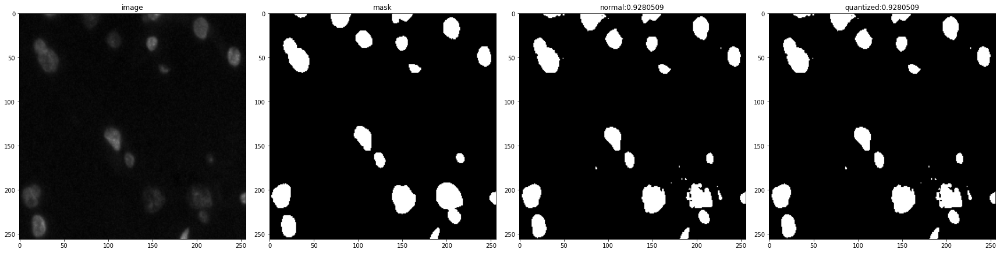

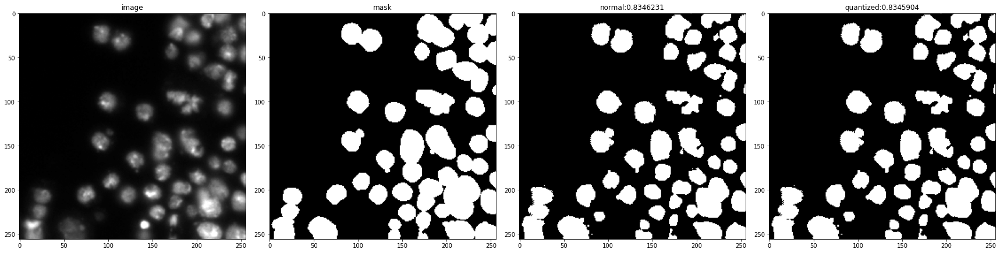

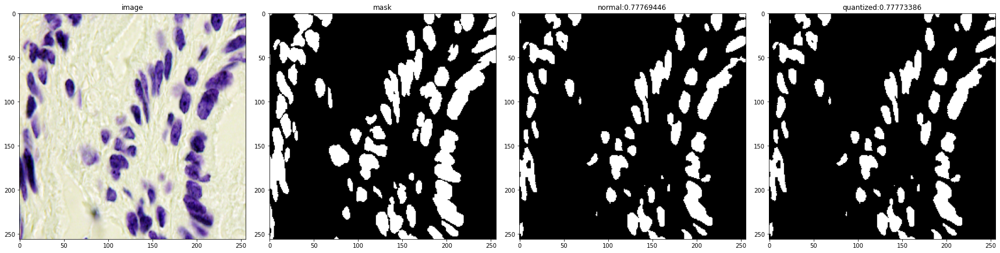

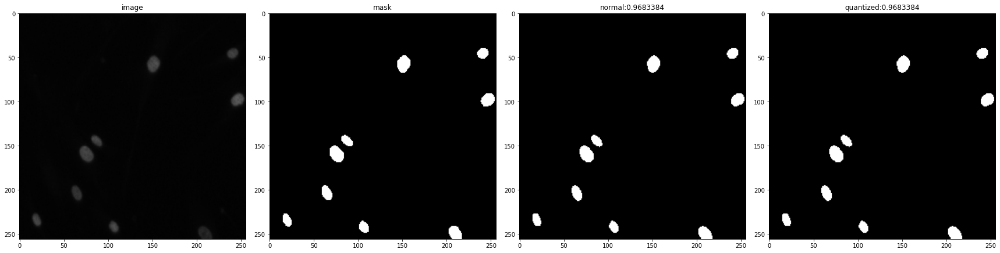

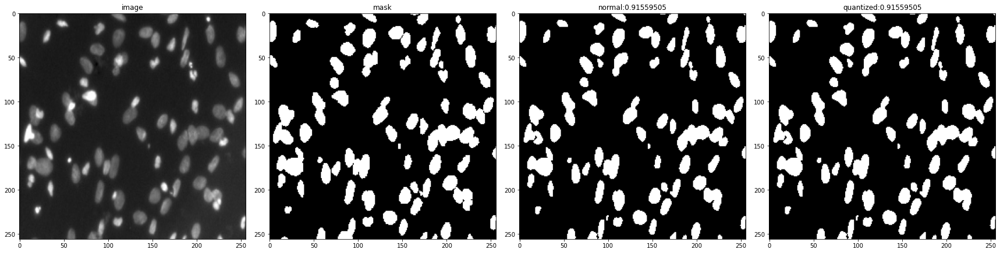

...

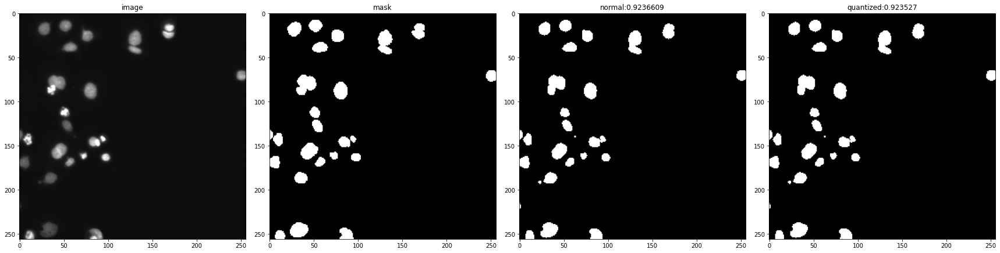

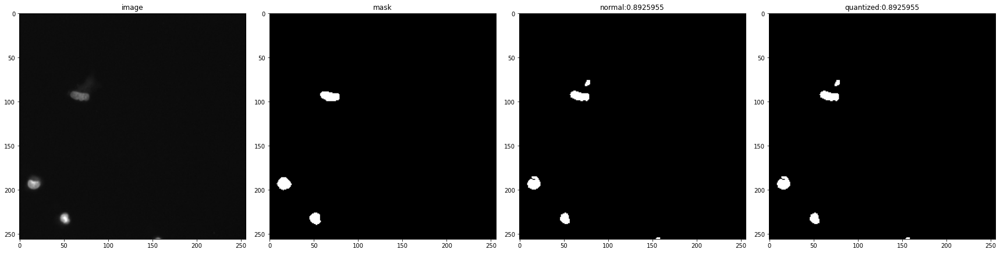

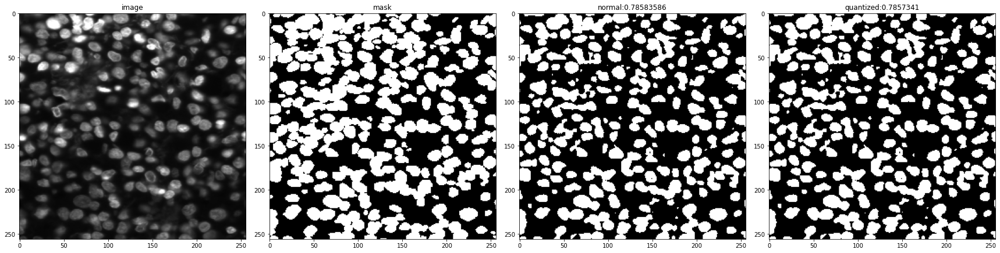

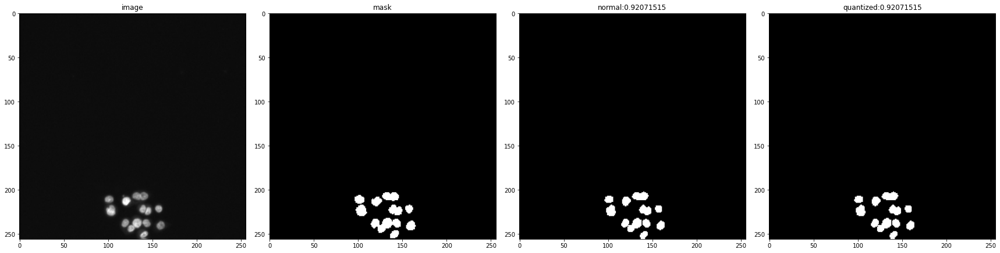

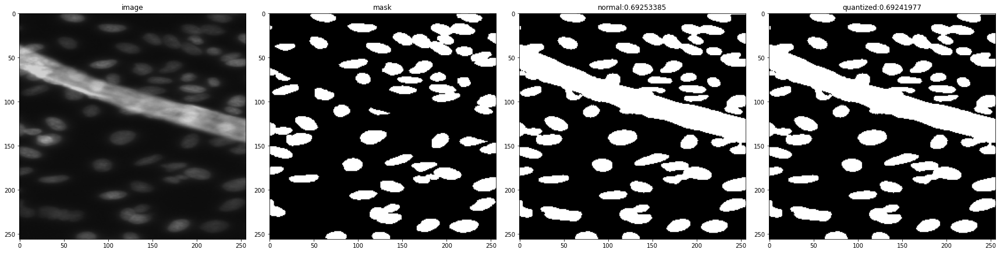

In [ ]:
for true_images, true_masks in dataset['val'].take(VALIDATION_STEPS):
    true_images = true_images
    true_masks = true_masks
    for j in range(len(true_masks)):
      input_data = true_images[j].reshape(input_shape)

      interpreter.set_tensor(input_details[0]['index'], input_data)
      interpreter.invoke()
      output_data = np.round(interpreter.get_tensor(output_details[0]['index']))

      interpreter_quant.set_tensor(input_details_quant[0]['index'], input_data)
      interpreter_quant.invoke()
      output_data_quant = np.round(interpreter_quant.get_tensor(output_details_quant[0]['index']))

      fig, axes = plt.subplots(1, 4, figsize=(24, 8))
      ax = axes.ravel()
      ax[0].imshow(true_images[j])
      ax[0].set_title('image')
      ax[1].imshow(true_masks[j][:,:,0], cmap='gray')
      ax[1].set_title('mask')
      ax[2].imshow(output_data[0,:,:,0], cmap='gray')
      ax[2].set_title('normal:' + str(mean_iou_single(true_masks[j], output_data[0])))
      ax[3].imshow(output_data_quant[0,:,:,0], cmap='gray')
      ax[3].set_title('quantized:' + str(mean_iou_single(true_masks[j], output_data_quant[0])))
      fig.tight_layout()
      plt.show()

## UNet++

In [11]:
#Loading the model
dependencies = {'mean_iou_batch':mean_iou_batch}
model = tf.keras.models.load_model('models/unet2_1.h5', custom_objects=dependencies)

#Converting the model to a tflite model and exporting
converter = tf.lite.TFLiteConverter.from_keras_model(model)
tflite_model = converter.convert()
open("models/tflite_unet2_1.tflite", "wb").write(tflite_model)

#Converting to a tflite model with quantization and export
converter.optimizations = [tf.lite.Optimize.DEFAULT]
converter.target_spec.supported_types = [tf.float16]
tflite_model_quant = converter.convert()
open("models/tflite_unet2_1_quant.tflite", "wb").write(tflite_model_quant)

INFO:tensorflow:Assets written to: /tmp/tmplb1qo2rh/assets


/usr/local/lib/python3.7/dist-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


INFO:tensorflow:Assets written to: /tmp/tmpps7r5u5c/assets


INFO:tensorflow:Assets written to: /tmp/tmpps7r5u5c/assets
/usr/local/lib/python3.7/dist-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


9393680

In [12]:
print("Float model in Mb:", os.path.getsize('models/tflite_unet2_1.tflite') / float(2**20))
print("Quantized model in Mb:", os.path.getsize('models/tflite_unet2_1_quant.tflite') / float(2**20))
print("Compression ratio:", os.path.getsize('models/tflite_unet2_1.tflite')/os.path.getsize('models/tflite_unet2_1_quant.tflite'))

Float model in Mb: 17.8902587890625
Quantized model in Mb: 8.958511352539062
Compression ratio: 1.9970124594408156


### Evaluation

In [13]:
import tensorflow.python.ops.numpy_ops as np_config
np_config.enable_numpy_behavior()
import time

**Unquantized Model**

In [14]:
# Load TFLite model and allocate tensors.
interpreter = tf.lite.Interpreter(model_path="models/tflite_unet2_1.tflite")
interpreter.allocate_tensors()
# Get input and output tensors.
input_details = interpreter.get_input_details()
output_details = interpreter.get_output_details()
# Test model on some input data.
input_shape = input_details[0]['shape']

STEPS_PER_EPOCH = len(TRAIN_IDS) // BATCH_SIZE
VALIDATION_STEPS = len(VAL_IDS) // BATCH_SIZE

In [15]:
start = time.time()

scores = []
for true_images, true_masks in tqdm(val_dataset.take(VALIDATION_STEPS)):
    true_images = true_images
    true_masks = true_masks
    for j in range(len(true_masks)):
      input_data = true_images[j].reshape(input_shape)
      interpreter.set_tensor(input_details[0]['index'], input_data)
      interpreter.invoke()
      output_data = interpreter.get_tensor(output_details[0]['index'])
      scores.append(mean_iou_single(true_masks[j], output_data[0]))

print('val score', np.mean(scores))

end = time.time()
print('Average time per sample (in s): {}'.format(np.round((end-start)/len(VAL_IDS), 3)))

  0%|          | 0/4 [00:00<?, ?it/s]

val score 0.86026675
Average time per sample (in s): 1.661


**Quantized Model**

In [16]:
# Load TFLite model and allocate tensors.
interpreter = tf.lite.Interpreter(model_path="models/tflite_unet2_1_quant.tflite")
interpreter.allocate_tensors()
# Get input and output tensors.
input_details = interpreter.get_input_details()
output_details = interpreter.get_output_details()
# Test model on some input data.
input_shape = input_details[0]['shape']

STEPS_PER_EPOCH = len(TRAIN_IDS) // BATCH_SIZE
VALIDATION_STEPS = len(VAL_IDS) // BATCH_SIZE

In [17]:
start = time.time()

scores = []
for true_images, true_masks in tqdm(val_dataset.take(VALIDATION_STEPS)):
    true_images = true_images
    true_masks = true_masks
    for j in range(len(true_masks)):
      input_data = true_images[j].reshape(input_shape)
      interpreter.set_tensor(input_details[0]['index'], input_data)
      interpreter.invoke()
      output_data = interpreter.get_tensor(output_details[0]['index'])
      scores.append(mean_iou_single(true_masks[j], output_data[0]))

print('val score', np.mean(scores))

end = time.time()
print('Average time per sample (in s): {}'.format(np.round((end-start)/len(VAL_IDS), 3)))

  0%|          | 0/4 [00:00<?, ?it/s]

val score 0.86026
Average time per sample (in s): 1.655


# Summary

* Quantization was done on UNet (unet_1) and UNet++ (unet2_1), with mean iou scores of 0.861 and 0.8602
* I quantized the model converting dtype to float16, reducing the model size by half.
* The model performance did not reduce at all, for both the models. 
* In terms of inference time, there was increase from 0.964 to 0.126 for unet but no changes as such for unet++